# Demo Run

In [1]:
# %load_ext autoreload
# %autoreload 2
# # # this may cause DisentenglementTargetManager to reimported, losing all the data e.g. configurations.

In [2]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

In [3]:
import os
import sys
import gc
import warnings
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np

import rapids_singlecell as rsc
import scanpy as sc
import cupyx as cpx
import pandas as pd
import numpy as np

sc.settings.verbosity = 3

import scib
import scib_metrics

sys.path.append(str(Path(os.getcwd()).resolve().parents[0]))
import tardis

local_run = False
if local_run:
    tardis.config = tardis.config_local
else:
    tardis.config = tardis.config_server
print(f"CUDA used: {torch.cuda.is_available()}")

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/xla.py:18: DeprecationWarning: `ModuleAvailableCache` is a special case of `RequirementCache`. Please use `RequirementCache(module=...)` instead.
  from lightning.fabric.accelerators.tpu import _XLA_AVAILABLE, TPUAccelerator
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/__init__.py:36: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('lightning.fabric')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  __import__("pkg_resources").declare_na

CUDA used: True


In [4]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_subset_age_4.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.obs["age"] = adata.obs["age"].astype("str").astype("category")

In [5]:
updated_obs = pd.read_csv(
    os.path.join("/lustre/groups/ml01/workspace/kemal.inecik/hdca/data", "metadata", "combined_with_hierarchy", "anno_V1.csv"),
    index_col="Unnamed: 0"
)
new_cols = ['LVL3', 'LVL2', 'LVL1', 'LVL0']
adata.obs = pd.concat([adata.obs.copy(), updated_obs.loc[adata.obs.index][new_cols]], axis=1)
adata

/tmp/ipykernel_1254768/2252501852.py:1: DtypeWarning: Columns (3,7,8,9,11,17,18,20,22,23,27,28,30,31) have mixed types. Specify dtype option on import or set low_memory=False.
  updated_obs = pd.read_csv(


AnnData object with n_obs × n_vars = 745264 × 4096
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'LVL3', 'LVL2', 'LVL1', 'LVL0'
    uns: 'rank_genes_groups'

In [6]:
!ls -lh /lustre/groups/ml01/workspace/kemal.inecik/tardis_data/models

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


total 20K
drwxr-xr-x. 2 kemal.inecik OG-ICB-User 4.0K Apr 18 14:07 run6.1_dataset_subset_age_4
drwxr-xr-x. 2 kemal.inecik OG-ICB-User 4.0K Apr 18 13:20 run6.2_dataset_subset_age_4
drwxr-xr-x. 2 kemal.inecik OG-ICB-User 4.0K Apr 18 15:36 run6.3_dataset_subset_age_4
drwxr-xr-x. 2 kemal.inecik OG-ICB-User 4.0K Apr 18 03:44 run6.4_dataset_subset_age_4
drwxr-xr-x. 2 kemal.inecik OG-ICB-User 4.0K Apr 18 13:10 run7


## Base scVI

In [13]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "run6.4_dataset_subset_age_4"
)
vae = tardis.MyModel.load(dir_path, adata=adata)

batch_size = 512
results = {
    "reconstruction_error": vae.get_reconstruction_error(batch_size=batch_size)['reconstruction_loss'],
    "elbo": vae.get_elbo(batch_size=batch_size).item(),
    "r2_train": vae.get_reconstruction_r2(batch_size=batch_size, indices=vae.train_indices),
    "r2_train_deg_20": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=20, batch_size=batch_size, indices=vae.train_indices),
    "r2_train_deg_50": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=50, batch_size=batch_size, indices=vae.train_indices),
    "r2_validation": vae.get_reconstruction_r2(batch_size=batch_size, indices=vae.validation_indices),
    "r2_validation_deg_20": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=20, batch_size=batch_size, indices=vae.validation_indices),
    "r2_validation_deg_50": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=50, batch_size=batch_size, indices=vae.validation_indices),
}
for k, v in results.items():
    print(k, v)

INFO     File /lustre/groups/ml01/workspace/kemal.inecik/tardis_data/models/run6.4_dataset_subset_age_4/model.pt   
         already downloaded                                                                                        


CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8800, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


reconstruction_error -237.5222888403472
elbo -247.1799774169922
r2_train 0.7466870315491592
r2_train_deg_20 0.4102227782552316
r2_train_deg_50 0.32083799628937953
r2_validation 0.6228075836196799
r2_validation_deg_20 0.4754672628924638
r2_validation_deg_50 0.3615258800695623


In [14]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(adata=latent, n_neighbors = 50)
rsc.tl.umap(adata=latent)
rsc.tl.diffmap(adata=latent)

root_age = latent.obs['age'].astype(float).min()
latent.uns['iroot'] = np.flatnonzero(latent.obs['age'] == str(root_age))[0]
sc.tl.dpt(latent)
latent

AnnData object with n_obs × n_vars = 745264 × 30
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'LVL3', 'LVL2', 'LVL1', 'LVL0', '_scvi_batch', '_scvi_labels', 'dpt_pseudotime'
    uns: 'neighbors', 'umap', 'diffmap_evals', 'iroot'
    obsm: 'X_umap', 'X_diffmap'
    obsp: 'distances', 'connectivities'

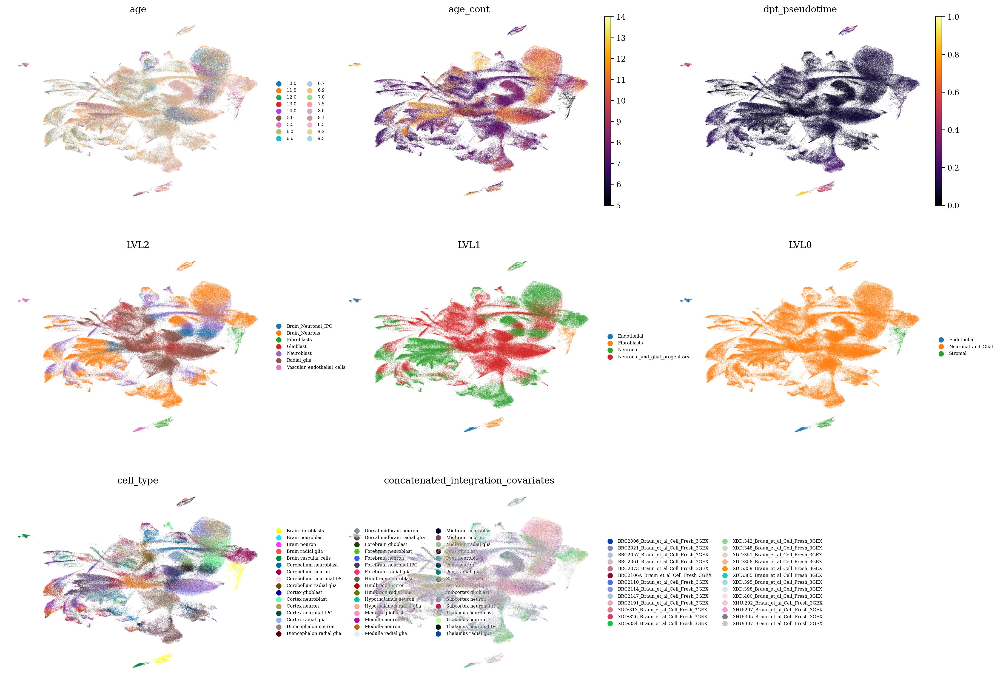

In [15]:
latent.obs["age_cont"] = latent.obs['age'].astype(float)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["age", "age_cont", "dpt_pseudotime",
               'LVL2', 'LVL1', 'LVL0',
               "cell_type", "concatenated_integration_covariates"], 
        ncols=3,
        color_map="inferno",
        frameon=False,
        legend_fontsize="xx-small"
    )

In [ ]:
# def generate_random_colors(num_colors):
#     return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
# unique_cell_types = latent.obs["LVL3"].unique()
# # Generate random colors for each unique cell type
# random_colors = generate_random_colors(len(unique_cell_types))
# # Create a dictionary to map cell types to colors
# color_map = dict(zip(unique_cell_types, random_colors))

# plt.figure(figsize=(15, 15))
# sc.pl.umap(
#     latent, 
#     color=["LVL3"], 
#     frameon=False,
#     legend_loc="on data",
#     legend_fontsize=6,
#     legend_fontweight="bold",
#     title="Cell Type",
#     size=3,
#     palette=color_map,
#     ax=plt.gca(),
#     show=False
# )
# plt.show()

## trained tardis 1

In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "run6.1_dataset_subset_age_4"
)
vae = tardis.MyModel.load(dir_path, adata=adata)

batch_size = 512
results = {
    "reconstruction_error": vae.get_reconstruction_error(batch_size=batch_size)['reconstruction_loss'],
    "elbo": vae.get_elbo(batch_size=batch_size).item(),
    "r2_train": vae.get_reconstruction_r2(batch_size=batch_size, indices=vae.train_indices),
    "r2_train_deg_20": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=20, batch_size=batch_size, indices=vae.train_indices),
    "r2_train_deg_50": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=50, batch_size=batch_size, indices=vae.train_indices),
    "r2_validation": vae.get_reconstruction_r2(batch_size=batch_size, indices=vae.validation_indices),
    "r2_validation_deg_20": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=20, batch_size=batch_size, indices=vae.validation_indices),
    "r2_validation_deg_50": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=50, batch_size=batch_size, indices=vae.validation_indices),
}
for k, v in results.items():
    print(k, v)

INFO     File /lustre/groups/ml01/workspace/kemal.inecik/tardis_data/models/run6.1_dataset_subset_age_4/model.pt   
         already downloaded                                                                                        


CUDA backend failed to initialize: Unable to use CUDA because of the following issues with CUDA components:
Outdated CUDA installation found.
Version JAX was built against: 11080
Minimum supported: 12010
Installed version: 11080
The local installation version must be no lower than 12010.
--------------------------------------------------
Outdated cuDNN installation found.
Version JAX was built against: 8800
Minimum supported: 8900
Installed version: 8700
The local installation version must be no lower than 8900.
--------------------------------------------------
Outdated cuBLAS installation found.
Version JAX was built against: 111103
Minimum supported: 120100
Installed version: 111103
The local installation version must be no lower than 120100.
--------------------------------------------------
Outdated cuSPARSE installation found.
Version JAX was built against: 11705
Minimum supported: 12100
Installed version: 11705
The local installation version must be no lower than 12100. (Set TF_

reconstruction_error -238.7710317459652
elbo -269.9805603027344
r2_train 0.7479054289572428
r2_train_deg_20 0.3849523725098609
r2_train_deg_50 0.32685697032252997
r2_validation 0.7323901740531596
r2_validation_deg_20 0.42524440476341685
r2_validation_deg_50 0.3277499588257043


In [8]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(adata=latent, n_neighbors = 50)
rsc.tl.umap(adata=latent)
rsc.tl.diffmap(adata=latent)

root_age = latent.obs['age'].astype(float).min()
latent.uns['iroot'] = np.flatnonzero(latent.obs['age'] == str(root_age))[0]
sc.tl.dpt(latent)
latent

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/cupy/sparse/__init__.py:17: DeprecationWarning: cupy.sparse is deprecated. Use cupyx.scipy.sparse instead.
  warnings.warn(msg, DeprecationWarning)


computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


AnnData object with n_obs × n_vars = 745264 × 30
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'LVL3', 'LVL2', 'LVL1', 'LVL0', '_scvi_batch', '_scvi_labels', 'dpt_pseudotime'
    uns: 'neighbors', 'umap', 'diffmap_evals', 'iroot'
    obsm: 'X_umap', 'X_diffmap'
    obsp: 'distances', 'connectivities'

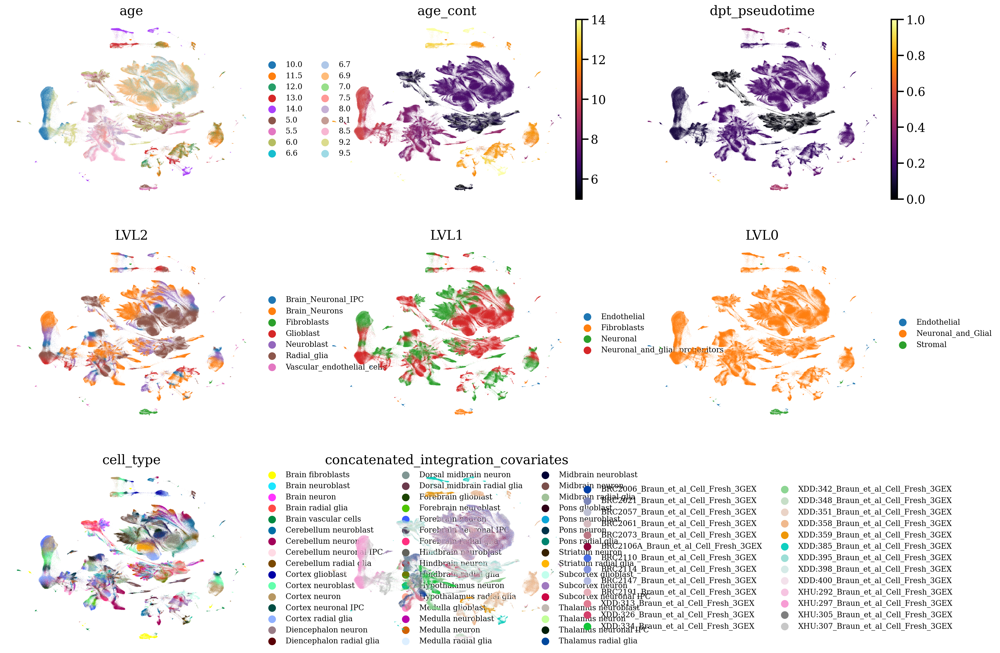

In [9]:
latent.obs["age_cont"] = latent.obs['age'].astype(float)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["age", "age_cont", "dpt_pseudotime",
               'LVL2', 'LVL1', 'LVL0',
               "cell_type", "concatenated_integration_covariates"], 
        ncols=3,
        color_map="inferno",
        frameon=False,
        legend_fontsize="xx-small"
    )

In [10]:
del latent
gc.collect();

In [ ]:
from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("age").reserved_latent_indices], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(adata=latent, n_neighbors = 50)
rsc.tl.umap(adata=latent)
rsc.tl.diffmap(adata=latent)

root_age = latent.obs['age'].astype(float).min()
latent.uns['iroot'] = np.flatnonzero(latent.obs['age'] == str(root_age))[0]
sc.tl.dpt(latent)
latent

In [ ]:
latent.obs["age_cont"] = latent.obs['age'].astype(float)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["age", "age_cont", "dpt_pseudotime",
               'LVL2', 'LVL1', 'LVL0',
               "cell_type", "concatenated_integration_covariates"], 
        ncols=3,
        color_map="inferno",
        frameon=False,
        legend_fontsize="xx-small"
    )

In [ ]:
del latent
gc.collect();

In [ ]:
# def generate_random_colors(num_colors):
#     return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
# unique_cell_types = latent.obs["LVL3"].unique()
# # Generate random colors for each unique cell type
# random_colors = generate_random_colors(len(unique_cell_types))
# # Create a dictionary to map cell types to colors
# color_map = dict(zip(unique_cell_types, random_colors))

# plt.figure(figsize=(15, 15))
# sc.pl.umap(
#     latent, 
#     color=["LVL3"], 
#     frameon=False,
#     legend_loc="on data",
#     legend_fontsize=6,
#     legend_fontweight="bold",
#     title="Cell Type",
#     size=3,
#     palette=color_map,
#     ax=plt.gca(),
#     show=False
# )
# plt.show()